# Visión por computadora - TP3
Cohorte 25 - 3er bimestre 2026
Integrantes:

a2413, César Hernán Ruggeri

a2512, Armando Tomás Civini

a2521, Andrea Tatiana Duran

a2525, Pablo David Gorosito

a2542, Federico Tombesi

## Objetivo

El trabajo tiene tres objetivos:

1. Obtener **una detección del logo en cada imagen sin falsos positivos**.
2. Plantear y validar un algoritmo para **múltiples detecciones** en `coca_multi.png`, utilizando el mismo template.
3. Generalizar el algoritmo de detección múltiple al conjunto completo y visualizar cada detección mediante **bounding boxes y un nivel de confianza**.

## Enfoque adoptado

La solución utiliza dos estrategias complementarias.

Para el ítem 1 se emplean características locales SIFT, correspondencia
de descriptores mediante FLANN y BFMatcher, ratio test de Lowe y estimación
de una homografía mediante RANSAC.

Para los ítems de detección múltiple se implementa template matching
multiescala, combinando similitud por intensidades y por bordes, máximos
locales y Non-Maximum Suppression (NMS).

## 1. Preparación del entorno y carga de datos

En esta sección se prepara el entorno, se definen las rutas del TP3 y se verifican los archivos de entrada. El template se carga en escala de grises porque SIFT construye sus características a partir de variaciones de intensidad y no requiere información de color.


In [6]:
from pathlib import Path
import subprocess

import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

REPO_URL = (
    "https://github.com/"
    "FIUBA-Posgrado-Inteligencia-Artificial/"
    "vision_computadora_I.git"
)

LOCAL_DIR = Path("vision_computadora_I")
LOCAL_TP3_DIR = LOCAL_DIR / "Material_TPs" / "TP3"
WORKSPACE_TP3_DIR = Path(".")

if (WORKSPACE_TP3_DIR / "images").is_dir() and (
    WORKSPACE_TP3_DIR / "template" / "pattern.png"
).is_file():
    TP3_DIR = WORKSPACE_TP3_DIR
else:
    if not LOCAL_TP3_DIR.exists():
        subprocess.run(
            ["git", "clone", "--depth", "1", REPO_URL],
            check=True
        )
    TP3_DIR = LOCAL_TP3_DIR

IMAGES_DIR = TP3_DIR / "images"
TEMPLATE_PATH = TP3_DIR / "template" / "pattern.png"

for path in [TP3_DIR, IMAGES_DIR, TEMPLATE_PATH]:
    if not path.exists():
        raise FileNotFoundError(f"No se encontró: {path}")

VALID_EXTENSIONS = {".png", ".jpg", ".jpeg", ".bmp"}

image_paths = sorted(
    p for p in IMAGES_DIR.iterdir()
    if p.is_file() and p.suffix.lower() in VALID_EXTENSIONS
)

if not image_paths:
    raise FileNotFoundError(
        f"No se encontraron imágenes en {IMAGES_DIR}"
    )

template_gray = cv.imread(
    str(TEMPLATE_PATH),
    cv.IMREAD_GRAYSCALE
)

if template_gray is None:
    raise ValueError(
        f"No se pudo leer el template: {TEMPLATE_PATH}"
    )

template_h, template_w = template_gray.shape

print(f"Cantidad de imágenes: {len(image_paths)}")
print(f"Template: {TEMPLATE_PATH.name}")
print(f"Dimensiones del template: {template_w} x {template_h}")

for path in image_paths:
    print(f"- {path.name}")

Cantidad de imágenes: 7
Template: pattern.png
Dimensiones del template: 400 x 175
- COCA-COLA-LOGO.jpg
- coca_logo_1.png
- coca_logo_2.png
- coca_multi.png
- coca_retro_1.png
- coca_retro_2.png
- logo_1.png


### Verificación inicial

Antes de realizar la detección se comprueba que todas las imágenes y el template puedan leerse correctamente. El template conserva su relación de aspecto original; la adaptación a cambios de tamaño será resuelta por las características SIFT y la homografía.


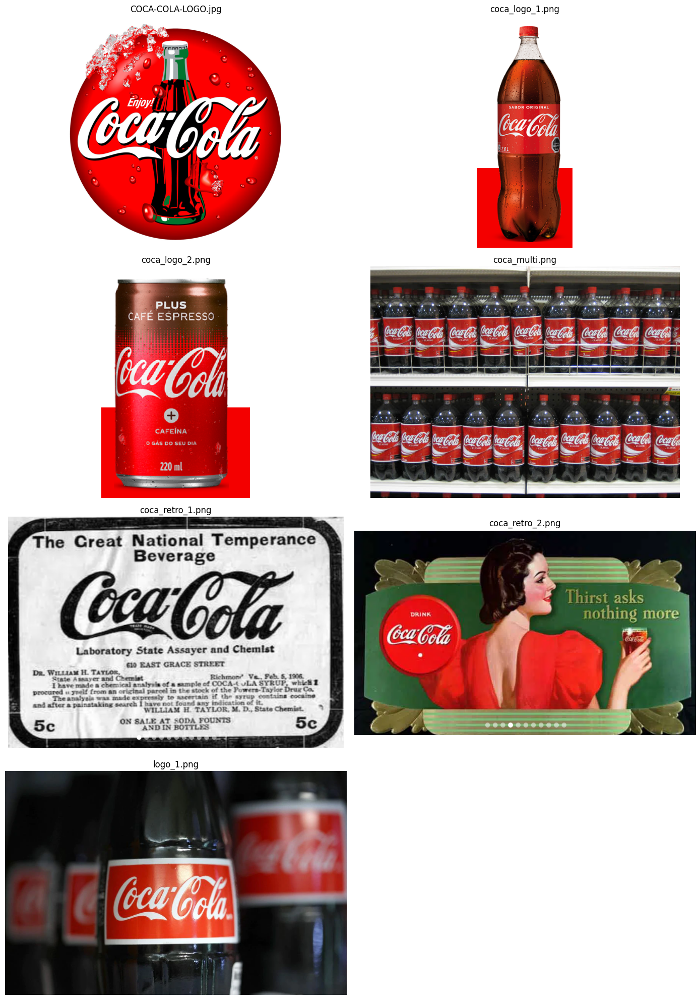

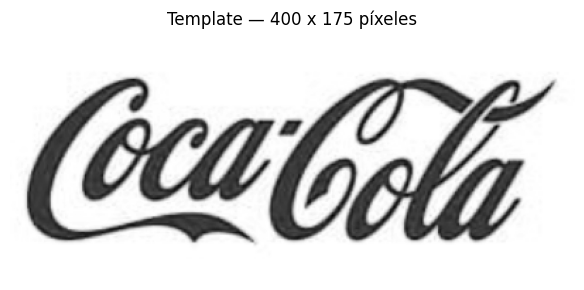

In [7]:
n_images = len(image_paths)
n_cols = 2
n_rows = int(np.ceil(n_images / n_cols))

plt.figure(figsize=(14, 5 * n_rows))

for i, image_path in enumerate(image_paths, start=1):
    image_bgr = cv.imread(str(image_path))

    if image_bgr is None:
        raise ValueError(f"No se pudo leer {image_path.name}")

    image_rgb = cv.cvtColor(image_bgr, cv.COLOR_BGR2RGB)

    plt.subplot(n_rows, n_cols, i)
    plt.imshow(image_rgb)
    plt.title(image_path.name)
    plt.axis("off")

plt.tight_layout()
plt.show()

plt.figure(figsize=(8, 3))
plt.imshow(template_gray, cmap="gray")
plt.title(f"Template — {template_w} x {template_h} píxeles")
plt.axis("off")
plt.tight_layout()
plt.show()


## 2. Construcción del detector robusto

### 2.1. Preprocesamiento y características SIFT

Para mejorar la estabilidad frente a diferencias de iluminación se utiliza CLAHE sobre las imágenes en escala de grises. Además, se consideran dos polaridades del template: la original y su versión invertida. Ambas provienen del mismo template y permiten contemplar logos oscuros sobre fondo claro y logos claros sobre fondo oscuro.

No se realiza una búsqueda manual de escalas porque SIFT está diseñado para detectar características en un espacio de escala.


In [8]:
def preprocess_gray(gray):
    if gray is None:
        raise ValueError("La imagen recibida es None.")

    clahe = cv.createCLAHE(
        clipLimit=2.0,
        tileGridSize=(8, 8)
    )

    return clahe.apply(gray)


def build_template_variants(template_gray):
    template_eq = preprocess_gray(template_gray)

    return {
        "directa": template_eq,
        "invertida": 255 - template_eq
    }


### 2.2. SIFT + FLANN + ratio test de Lowe

SIFT detecta puntos característicos y calcula descriptores locales. Para asociar esos descriptores entre el template y la imagen se utiliza FLANN con dos vecinos cercanos (`K=2`).

El ratio test de Lowe conserva una correspondencia cuando el mejor vecino es claramente mejor que el segundo. Se utiliza `0.80`, valor coherente con el procedimiento trabajado en clase.

RANSAC se aplica posteriormente para estimar una homografía y eliminar correspondencias incompatibles con una misma transformación geométrica.


In [9]:
# ============================================================
# Configuración de SIFT, matching y RANSAC
# ============================================================

SIFT_CONTRAST_THRESHOLD = 0.02
LOWE_RATIO = 0.80

RANSAC_REPROJECTION_THRESHOLD = 5.0

MIN_GOOD_MATCHES = 6
MIN_INLIERS = 5
MIN_INLIER_RATIO = 0.30


# ============================================================
# Configuración de FLANN
# ============================================================

FLANN_INDEX_KDTREE = 1

FLANN_INDEX_PARAMS = dict(
    algorithm=FLANN_INDEX_KDTREE,
    trees=5
)

FLANN_SEARCH_PARAMS = dict(
    checks=80
)


# ============================================================
# Creación de SIFT
# ============================================================

def create_sift():
    return cv.SIFT_create(
        contrastThreshold=SIFT_CONTRAST_THRESHOLD
    )


# ============================================================
# Keypoints y descriptores SIFT
# ============================================================

def compute_sift_features(gray):
    sift = create_sift()

    keypoints, descriptors = sift.detectAndCompute(
        gray,
        None
    )

    return keypoints, descriptors


# ============================================================
# Matching mediante FLANN + ratio test de Lowe
# ============================================================

def flann_ratio_matches(
    template_descriptors,
    image_descriptors,
    ratio_threshold=LOWE_RATIO
):
    if (
        template_descriptors is None
        or image_descriptors is None
    ):
        return []

    matcher = cv.FlannBasedMatcher(
        FLANN_INDEX_PARAMS,
        FLANN_SEARCH_PARAMS
    )

    knn_matches = matcher.knnMatch(
        template_descriptors,
        image_descriptors,
        k=2
    )

    good_matches = []

    for pair in knn_matches:

        if len(pair) < 2:
            continue

        m, n = pair

        if m.distance < ratio_threshold * n.distance:
            good_matches.append(m)

    return good_matches


# ============================================================
# Matching mediante BFMatcher + ratio test de Lowe
# ============================================================

def bf_ratio_matches(
    template_descriptors,
    image_descriptors,
    ratio_threshold=LOWE_RATIO
):
    if (
        template_descriptors is None
        or image_descriptors is None
    ):
        return []

    matcher = cv.BFMatcher(
        cv.NORM_L2,
        crossCheck=False
    )

    knn_matches = matcher.knnMatch(
        template_descriptors,
        image_descriptors,
        k=2
    )

    good_matches = []

    for pair in knn_matches:

        if len(pair) < 2:
            continue

        m, n = pair

        if m.distance < ratio_threshold * n.distance:
            good_matches.append(m)

    return good_matches

### 2.3. Validación geométrica

Una homografía puede calcularse matemáticamente y aun así representar una detección incorrecta. Por este motivo se valida el polígono proyectado antes de aceptarlo.

Se exige una cantidad mínima de inliers, una proporción mínima de inliers, un polígono convexo, un área razonable respecto de la imagen y una ubicación compatible con sus límites.


In [10]:
def validate_polygon(
    polygon,
    image_shape,
    inliers,
    inlier_ratio,
    min_inliers=MIN_INLIERS,
    min_inlier_ratio=MIN_INLIER_RATIO,
    min_area_ratio=0.001,
    max_area_ratio=0.65,
    boundary_tolerance=0.15
):
    if polygon is None:
        return False, {}

    points = np.asarray(
        polygon,
        dtype=np.float32
    ).reshape(-1, 2)

    if points.shape != (4, 2):
        return False, {}

    image_h, image_w = image_shape[:2]
    image_area = image_h * image_w

    contour = points.reshape(-1, 1, 2)

    polygon_area = abs(cv.contourArea(contour))
    area_ratio = polygon_area / image_area

    is_convex = cv.isContourConvex(
        contour.astype(np.int32)
    )

    x_min = -boundary_tolerance * image_w
    x_max = (1 + boundary_tolerance) * image_w
    y_min = -boundary_tolerance * image_h
    y_max = (1 + boundary_tolerance) * image_h

    inside_limits = bool(
        np.all(points[:, 0] >= x_min)
        and np.all(points[:, 0] <= x_max)
        and np.all(points[:, 1] >= y_min)
        and np.all(points[:, 1] <= y_max)
    )

    valid = bool(
        inliers >= min_inliers
        and inlier_ratio >= min_inlier_ratio
        and is_convex
        and inside_limits
        and min_area_ratio <= area_ratio <= max_area_ratio
    )

    metrics = {
        "area_ratio": float(area_ratio),
        "is_convex": bool(is_convex),
        "inside_limits": inside_limits
    }

    return valid, metrics


def geometric_confidence(inliers, inlier_ratio):
    evidence_factor = min(inliers / 12.0, 1.0)

    return float(
        np.clip(
            inlier_ratio * evidence_factor,
            0.0,
            1.0
        )
    )


## 3. Detector de una o múltiples instancias

Para detectar múltiples apariciones del mismo logo se utiliza RANSAC de manera iterativa. Se estima una homografía, se registra la detección si supera los controles geométricos y luego se eliminan las correspondencias asociadas a esa región para buscar una nueva instancia.


In [11]:
def detect_instances_from_matches(
    template_shape,
    template_keypoints,
    image_keypoints,
    good_matches,
    image_shape,
    template_variant_name,
    max_instances=10
):
    remaining_matches = list(good_matches)
    detections = []

    template_h, template_w = template_shape

    template_corners = np.float32(
        [
            [0, 0],
            [template_w - 1, 0],
            [template_w - 1, template_h - 1],
            [0, template_h - 1]
        ]
    ).reshape(-1, 1, 2)

    attempts = 0

    while (
        len(remaining_matches) >= MIN_GOOD_MATCHES
        and len(detections) < max_instances
        and attempts < max_instances * 3
    ):
        attempts += 1

        src_pts = np.float32(
            [
                template_keypoints[m.queryIdx].pt
                for m in remaining_matches
            ]
        ).reshape(-1, 1, 2)

        dst_pts = np.float32(
            [
                image_keypoints[m.trainIdx].pt
                for m in remaining_matches
            ]
        ).reshape(-1, 1, 2)

        H, mask = cv.findHomography(
            src_pts,
            dst_pts,
            cv.RANSAC,
            RANSAC_REPROJECTION_THRESHOLD
        )

        if H is None or mask is None:
            break

        mask = mask.ravel().astype(bool)

        inlier_count = int(mask.sum())
        total_matches = len(remaining_matches)

        inlier_ratio = (
            inlier_count / total_matches
            if total_matches > 0
            else 0.0
        )

        projected = cv.perspectiveTransform(
            template_corners,
            H
        )

        geometry_valid, geometry = validate_polygon(
            polygon=projected,
            image_shape=image_shape,
            inliers=inlier_count,
            inlier_ratio=inlier_ratio
        )

        if geometry_valid:
            polygon = np.int32(projected).reshape(-1, 2)

            x, y, w, h = cv.boundingRect(
                polygon.reshape(-1, 1, 2)
            )

            confidence = geometric_confidence(
                inliers=inlier_count,
                inlier_ratio=inlier_ratio
            )

            detections.append(
                {
                    "box": (
                        int(x),
                        int(y),
                        int(x + w),
                        int(y + h)
                    ),
                    "polygon": polygon,
                    "homography": H,
                    "matches": total_matches,
                    "inliers": inlier_count,
                    "inlier_ratio": float(inlier_ratio),
                    "confidence": confidence,
                    "template_variant": template_variant_name,
                    "area_ratio": geometry["area_ratio"]
                }
            )

            contour = polygon.astype(
                np.float32
            ).reshape(-1, 1, 2)

            filtered_matches = []

            for m in remaining_matches:
                point = image_keypoints[m.trainIdx].pt

                inside = cv.pointPolygonTest(
                    contour,
                    point,
                    False
                )

                if inside < 0:
                    filtered_matches.append(m)

            remaining_matches = filtered_matches

        else:
            remaining_matches = [
                m for m, keep in zip(remaining_matches, mask)
                if not keep
            ]

            if not np.any(mask):
                break

    return detections


In [12]:
def bbox_iou(box_a, box_b):
    x1 = max(box_a[0], box_b[0])
    y1 = max(box_a[1], box_b[1])
    x2 = min(box_a[2], box_b[2])
    y2 = min(box_a[3], box_b[3])

    inter_w = max(0, x2 - x1)
    inter_h = max(0, y2 - y1)
    intersection = inter_w * inter_h

    area_a = max(0, box_a[2] - box_a[0]) * max(
        0,
        box_a[3] - box_a[1]
    )

    area_b = max(0, box_b[2] - box_b[0]) * max(
        0,
        box_b[3] - box_b[1]
    )

    union = area_a + area_b - intersection

    if union <= 0:
        return 0.0

    return intersection / union


def non_maximum_suppression_detections(
    detections,
    iou_threshold=0.35
):
    detections = sorted(
        detections,
        key=lambda d: d["confidence"],
        reverse=True
    )

    selected = []

    for detection in detections:

        overlaps = [
            bbox_iou(
                detection["box"],
                kept["box"]
            )
            for kept in selected
        ]

        if not overlaps or max(overlaps) < iou_threshold:
            selected.append(detection)

    return selected


In [13]:
def detect_logos(
    image_bgr,
    template_gray,
    max_instances=10
):
    if image_bgr is None:
        raise ValueError("La imagen de entrada es None.")

    image_gray = cv.cvtColor(
        image_bgr,
        cv.COLOR_BGR2GRAY
    )

    image_processed = preprocess_gray(
        image_gray
    )

    image_keypoints, image_descriptors = (
        compute_sift_features(
            image_processed
        )
    )

    if (
        image_descriptors is None
        or len(image_keypoints) == 0
    ):
        return []

    template_variants = build_template_variants(
        template_gray
    )

    all_detections = []

    for variant_name, variant_gray in template_variants.items():

        template_keypoints, template_descriptors = (
            compute_sift_features(
                variant_gray
            )
        )

        good_matches = flann_ratio_matches(
            template_descriptors,
            image_descriptors,
            ratio_threshold=LOWE_RATIO
        )

        if len(good_matches) < MIN_GOOD_MATCHES:
            continue

        variant_detections = detect_instances_from_matches(
            template_shape=variant_gray.shape,
            template_keypoints=template_keypoints,
            image_keypoints=image_keypoints,
            good_matches=good_matches,
            image_shape=image_bgr.shape,
            template_variant_name=variant_name,
            max_instances=max_instances
        )

        all_detections.extend(
            variant_detections
        )

    return non_maximum_suppression_detections(
        all_detections,
        iou_threshold=0.35
    )


### Visualización y confianza

El nivel mostrado en cada bounding box corresponde a una **confianza geométrica** derivada de los inliers de RANSAC. No se interpreta como una probabilidad estadística.


In [14]:
def draw_detections(
    image_bgr,
    detections
):
    output = image_bgr.copy()

    for index, detection in enumerate(
        detections,
        start=1
    ):
        x1, y1, x2, y2 = detection["box"]
        polygon = detection["polygon"]

        cv.polylines(
            output,
            [polygon],
            isClosed=True,
            color=(0, 255, 0),
            thickness=2,
            lineType=cv.LINE_AA
        )

        cv.rectangle(
            output,
            (x1, y1),
            (x2, y2),
            color=(0, 255, 0),
            thickness=2
        )

        label = (
            f"Logo {index} | "
            f"conf={detection['confidence']:.2f}"
        )

        cv.putText(
            output,
            label,
            (x1, max(25, y1 - 8)),
            cv.FONT_HERSHEY_SIMPLEX,
            0.55,
            color=(0, 255, 0),
            thickness=2,
            lineType=cv.LINE_AA
        )

    return output


# 4. Ítem 1 — Una detección por imagen sin falsos positivos

Para este punto se busca una única detección válida del logotipo en cada imagen, excluyendo `coca_multi.png`, que se reserva para el ítem 2.

Se utilizan características **SIFT** y dos estrategias de matching sobre los mismos descriptores:

- **FLANN**, como búsqueda aproximada de vecinos;
- **BFMatcher**, como búsqueda exacta de respaldo.

En ambos casos se aplica el **ratio test de Lowe**. A partir de las correspondencias aceptadas se estiman homografías mediante **RANSAC** y se validan geométricamente los candidatos.

Se consideran tanto una homografía global como consensos sucesivos. Finalmente se conserva una única detección: la candidata válida con mayor consistencia geométrica.


In [15]:
def detect_single_logo(
    image_bgr,
    template_gray
):
    if image_bgr is None:
        raise ValueError(
            "La imagen de entrada es None."
        )

    if template_gray is None:
        raise ValueError(
            "El template es None."
        )

    image_gray = cv.cvtColor(
        image_bgr,
        cv.COLOR_BGR2GRAY
    )

    image_processed = preprocess_gray(
        image_gray
    )

    image_keypoints, image_descriptors = (
        compute_sift_features(
            image_processed
        )
    )

    if (
        image_descriptors is None
        or len(image_keypoints) == 0
    ):
        return None

    template_variants = build_template_variants(
        template_gray
    )

    candidate_detections = []

    for variant_name, variant_gray in template_variants.items():

        template_keypoints, template_descriptors = (
            compute_sift_features(
                variant_gray
            )
        )

        if (
            template_descriptors is None
            or len(template_keypoints) == 0
        ):
            continue

        matching_strategies = {
            "FLANN": flann_ratio_matches(
                template_descriptors,
                image_descriptors,
                ratio_threshold=LOWE_RATIO
            ),
            "BF": bf_ratio_matches(
                template_descriptors,
                image_descriptors,
                ratio_threshold=LOWE_RATIO
            )
        }

        for matcher_name, good_matches in matching_strategies.items():

            if len(good_matches) < MIN_GOOD_MATCHES:
                continue

            # -----------------------------------------------
            # Estrategia A: homografía global
            # -----------------------------------------------

            src_pts = np.float32(
                [
                    template_keypoints[m.queryIdx].pt
                    for m in good_matches
                ]
            ).reshape(-1, 1, 2)

            dst_pts = np.float32(
                [
                    image_keypoints[m.trainIdx].pt
                    for m in good_matches
                ]
            ).reshape(-1, 1, 2)

            H, mask = cv.findHomography(
                src_pts,
                dst_pts,
                cv.RANSAC,
                RANSAC_REPROJECTION_THRESHOLD
            )

            if H is not None and mask is not None:

                mask = mask.ravel().astype(bool)

                inlier_count = int(
                    mask.sum()
                )

                inlier_ratio = (
                    inlier_count / len(good_matches)
                    if good_matches
                    else 0.0
                )

                template_h, template_w = (
                    variant_gray.shape
                )

                template_corners = np.float32(
                    [
                        [0, 0],
                        [template_w - 1, 0],
                        [template_w - 1, template_h - 1],
                        [0, template_h - 1]
                    ]
                ).reshape(-1, 1, 2)

                projected = cv.perspectiveTransform(
                    template_corners,
                    H
                )

                geometry_valid, geometry = (
                    validate_polygon(
                        polygon=projected,
                        image_shape=image_bgr.shape,
                        inliers=inlier_count,
                        inlier_ratio=inlier_ratio
                    )
                )

                if geometry_valid:

                    polygon = np.int32(
                        projected
                    ).reshape(-1, 2)

                    x, y, w, h = cv.boundingRect(
                        polygon.reshape(-1, 1, 2)
                    )

                    confidence = geometric_confidence(
                        inliers=inlier_count,
                        inlier_ratio=inlier_ratio
                    )

                    candidate_detections.append(
                        {
                            "box": (
                                int(x),
                                int(y),
                                int(x + w),
                                int(y + h)
                            ),
                            "polygon": polygon,
                            "homography": H,
                            "matches": len(good_matches),
                            "inliers": inlier_count,
                            "inlier_ratio": float(
                                inlier_ratio
                            ),
                            "confidence": confidence,
                            "template_variant": variant_name,
                            "area_ratio": geometry[
                                "area_ratio"
                            ],
                            "strategy": "global",
                            "matcher": matcher_name
                        }
                    )

            # -----------------------------------------------
            # Estrategia B: consensos sucesivos
            # -----------------------------------------------

            iterative_detections = (
                detect_instances_from_matches(
                    template_shape=variant_gray.shape,
                    template_keypoints=template_keypoints,
                    image_keypoints=image_keypoints,
                    good_matches=good_matches,
                    image_shape=image_bgr.shape,
                    template_variant_name=variant_name,
                    max_instances=5
                )
            )

            for detection in iterative_detections:

                detection = detection.copy()

                detection["strategy"] = "iterativa"
                detection["matcher"] = matcher_name

                candidate_detections.append(
                    detection
                )

    if not candidate_detections:
        return None

    candidate_detections = (
        non_maximum_suppression_detections(
            candidate_detections,
            iou_threshold=0.35
        )
    )

    best_detection = max(
        candidate_detections,
        key=lambda detection: (
            detection["confidence"],
            detection["inliers"]
        )
    )

    return best_detection


### Visualización y resumen del ítem 1

Se ejecuta el detector sobre las seis imágenes del ítem 1. Para cada resultado se muestran el bounding box y la confianza, y se registran además la cantidad de matches, los inliers, la variante del template, la estrategia geométrica y el matcher que produjo la detección seleccionada.

La condición de “sin falsos positivos” debe verificarse visualmente sobre las imágenes resultantes.


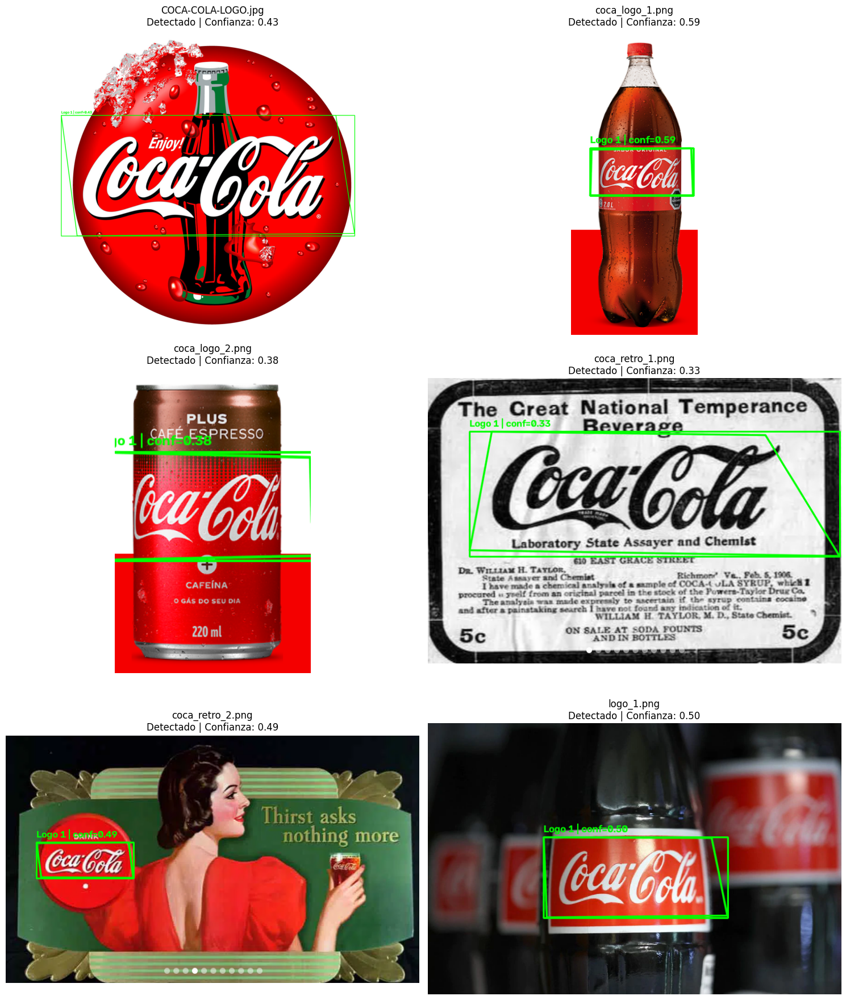

,imagen,estado,confianza,matches,inliers,ratio_inliers,variante_template,matcher,estrategia
0,COCA-COLA-LOGO.jpg,Detectado,0.428571,49,21,0.428571,invertida,BF,iterativa
1,coca_logo_1.png,Detectado,0.592593,54,32,0.592593,invertida,BF,global
2,coca_logo_2.png,Detectado,0.376471,85,32,0.376471,invertida,FLANN,global
3,coca_retro_1.png,Detectado,0.333333,45,15,0.333333,directa,BF,global
4,coca_retro_2.png,Detectado,0.488372,43,21,0.488372,invertida,BF,global
5,logo_1.png,Detectado,0.500000,56,28,0.500000,invertida,BF,global


Detecciones automáticas: 6 / 6


In [16]:
single_image_paths = [
    p for p in image_paths
    if p.name.lower() != "coca_multi.png"
]

item1_results = []

n_cols = 2
n_rows = int(
    np.ceil(len(single_image_paths) / n_cols)
)

plt.figure(
    figsize=(15, 6 * n_rows)
)

for index, image_path in enumerate(
    single_image_paths,
    start=1
):

    image_bgr = cv.imread(
        str(image_path)
    )

    if image_bgr is None:
        print(
            f"Advertencia: no se pudo leer {image_path.name}"
        )
        continue

    best_detection = detect_single_logo(
        image_bgr=image_bgr,
        template_gray=template_gray
    )

    if best_detection is not None:

        final_detections = [best_detection]

        status = "Detectado"
        confidence = best_detection["confidence"]
        matches = best_detection["matches"]
        inliers = best_detection["inliers"]
        inlier_ratio = best_detection["inlier_ratio"]
        template_variant = best_detection["template_variant"]
        strategy = best_detection["strategy"]
        matcher = best_detection["matcher"]

    else:

        final_detections = []

        status = "Sin detección válida"
        confidence = 0.0
        matches = 0
        inliers = 0
        inlier_ratio = 0.0
        template_variant = "-"
        strategy = "-"
        matcher = "-"

    output_bgr = draw_detections(
        image_bgr,
        final_detections
    )

    output_rgb = cv.cvtColor(
        output_bgr,
        cv.COLOR_BGR2RGB
    )

    item1_results.append(
        {
            "imagen": image_path.name,
            "estado": status,
            "confianza": confidence,
            "matches": matches,
            "inliers": inliers,
            "ratio_inliers": inlier_ratio,
            "variante_template": template_variant,
            "matcher": matcher,
            "estrategia": strategy
        }
    )

    plt.subplot(
        n_rows,
        n_cols,
        index
    )

    plt.imshow(output_rgb)

    plt.title(
        f"{image_path.name}\n"
        f"{status} | Confianza: {confidence:.2f}"
    )

    plt.axis("off")

plt.tight_layout()
plt.show()

item1_df = pd.DataFrame(
    item1_results
)

display(item1_df)

print(
    "Detecciones automáticas:",
    sum(
        result["estado"] == "Detectado"
        for result in item1_results
    ),
    "/",
    len(item1_results)
)


### Resultado del ítem 1

La salida anterior permite verificar la cobertura automática del detector sobre las seis imágenes. El cumplimiento del punto se establece al confirmar visualmente que cada bounding box corresponde al logotipo correcto y que no existen falsos positivos.

La columna `matcher` indica si la detección seleccionada surgió de FLANN o de BFMatcher; `estrategia` informa si la homografía elegida fue global o provino del procedimiento iterativo. La confianza expresa consistencia geométrica basada en RANSAC y no debe interpretarse como una probabilidad estadística.


# 5. Ítem 2 — Múltiples detecciones en `coca_multi.png`

En este punto ya no buscamos una única aparición del logo, sino detectar **múltiples instancias** dentro de la imagen `coca_multi.png`.

Para este caso se utiliza un enfoque distinto al del ítem 1: **template matching multiescala**. La razón es que, en una imagen con muchas copias similares del logo, los descriptores locales pueden volverse ambiguos, mientras que el template matching permite recorrer la imagen y localizar varias coincidencias del mismo patrón.

El procedimiento implementado es el siguiente:

1. generar varias escalas del template;
2. calcular similitud por intensidades;
3. calcular similitud sobre bordes;
4. combinar ambas respuestas;
5. conservar máximos locales por encima de un umbral;
6. aplicar **Non-Maximum Suppression (NMS)** para eliminar duplicados.

El resultado final debe mostrar una detección por cada aparición visible del logotipo, con su bounding box y nivel de confianza.

In [17]:
# ============================================================
# Detector múltiple generalizado
# Template matching multiescala + bordes + NMS
# ============================================================

# Rango de escalas más amplio para permitir
# generalización a imágenes con logos de distinto tamaño.
MULTI_SCALES = np.geomspace(
    0.15,
    1.20,
    72
)

MULTI_SCORE_THRESHOLD = 0.26
MULTI_NMS_IOU = 0.45

MAX_LOCAL_PEAKS_PER_SCALE = 100

CANNY_LOW = 50
CANNY_HIGH = 150

INTENSITY_WEIGHT = 0.45
EDGE_WEIGHT = 0.55

MIN_EDGE_DENSITY = 0.20


# ============================================================
# IoU
# ============================================================

def bbox_iou(box_a, box_b):

    x1 = max(box_a[0], box_b[0])
    y1 = max(box_a[1], box_b[1])
    x2 = min(box_a[2], box_b[2])
    y2 = min(box_a[3], box_b[3])

    intersection_width = max(
        0,
        x2 - x1
    )

    intersection_height = max(
        0,
        y2 - y1
    )

    intersection_area = (
        intersection_width
        * intersection_height
    )

    area_a = (
        max(0, box_a[2] - box_a[0])
        * max(0, box_a[3] - box_a[1])
    )

    area_b = (
        max(0, box_b[2] - box_b[0])
        * max(0, box_b[3] - box_b[1])
    )

    union_area = (
        area_a
        + area_b
        - intersection_area
    )

    if union_area <= 0:
        return 0.0

    return intersection_area / union_area


# ============================================================
# Non-Maximum Suppression
# ============================================================

def nms_detections(
    detections,
    iou_threshold=0.30
):

    if not detections:
        return []

    detections = sorted(
        detections,
        key=lambda detection: detection["confidence"],
        reverse=True
    )

    selected = []

    for detection in detections:

        keep = True

        for selected_detection in selected:

            overlap = bbox_iou(
                detection["box"],
                selected_detection["box"]
            )

            if overlap >= iou_threshold:
                keep = False
                break

        if keep:
            selected.append(
                detection
            )

    return selected


# ============================================================
# Máximos locales
# ============================================================

def local_maxima_mask(response):

    kernel = np.ones(
        (3, 3),
        np.uint8
    )

    dilated = cv.dilate(
        response.astype(np.float32),
        kernel
    )

    return response >= (dilated - 1e-7)


# ============================================================
# Densidad de bordes
# ============================================================

def edge_density(edge_image, box):

    x1, y1, x2, y2 = box

    roi = edge_image[
        y1:y2,
        x1:x2
    ]

    if roi.size == 0:
        return 0.0

    return float(
        np.count_nonzero(roi)
        / roi.size
    )


# ============================================================
# Detector generalizado
# ============================================================

def detect_logos_multiscale(
    image_bgr,
    template_gray,
    scales=MULTI_SCALES,
    score_threshold=MULTI_SCORE_THRESHOLD,
    nms_iou=MULTI_NMS_IOU,
    min_edge_density=MIN_EDGE_DENSITY
):

    if image_bgr is None:
        raise ValueError(
            "La imagen de entrada es None."
        )

    if template_gray is None:
        raise ValueError(
            "El template es None."
        )

    # --------------------------------------------------------
    # Imagen
    # --------------------------------------------------------

    image_gray = cv.cvtColor(
        image_bgr,
        cv.COLOR_BGR2GRAY
    )

    image_gray = preprocess_gray(
        image_gray
    )

    image_edges = cv.Canny(
        image_gray,
        CANNY_LOW,
        CANNY_HIGH
    )

    image_h, image_w = image_gray.shape

    # --------------------------------------------------------
    # Template
    # --------------------------------------------------------

    template_base = preprocess_gray(
        template_gray
    )

    candidates = []

    # --------------------------------------------------------
    # Búsqueda multiescala
    # --------------------------------------------------------

    for scale in scales:

        template_w_scaled = int(
            round(
                template_base.shape[1]
                * scale
            )
        )

        template_h_scaled = int(
            round(
                template_base.shape[0]
                * scale
            )
        )

        if (
            template_w_scaled < 18
            or template_h_scaled < 8
        ):
            continue

        if (
            template_w_scaled >= image_w
            or template_h_scaled >= image_h
        ):
            continue

        interpolation = (
            cv.INTER_AREA
            if scale < 1.0
            else cv.INTER_CUBIC
        )

        template_scaled = cv.resize(
            template_base,
            (
                template_w_scaled,
                template_h_scaled
            ),
            interpolation=interpolation
        )

        # ----------------------------------------------------
        # Bordes del template
        # ----------------------------------------------------

        template_edges = cv.Canny(
            template_scaled,
            CANNY_LOW,
            CANNY_HIGH
        )

        # ----------------------------------------------------
        # Matching por intensidades
        # ----------------------------------------------------

        intensity_response = cv.matchTemplate(
            image_gray,
            template_scaled,
            cv.TM_CCOEFF_NORMED
        )

        intensity_response = np.abs(
            intensity_response
        )

        # ----------------------------------------------------
        # Matching por bordes
        # ----------------------------------------------------

        edge_response = cv.matchTemplate(
            image_edges,
            template_edges,
            cv.TM_CCOEFF_NORMED
        )

        edge_response = np.clip(
            edge_response,
            0.0,
            1.0
        )

        # ----------------------------------------------------
        # Score combinado
        # ----------------------------------------------------

        combined_response = (
            INTENSITY_WEIGHT
            * intensity_response
            +
            EDGE_WEIGHT
            * edge_response
        )

        # ----------------------------------------------------
        # Máximos locales
        # ----------------------------------------------------

        peak_mask = (
            local_maxima_mask(
                combined_response
            )
            &
            (
                combined_response
                >= score_threshold
            )
        )

        ys, xs = np.where(
            peak_mask
        )

        if len(xs) == 0:
            continue

        scores = combined_response[
            ys,
            xs
        ]

        order = np.argsort(
            scores
        )[::-1][
            :MAX_LOCAL_PEAKS_PER_SCALE
        ]

        for idx in order:

            x = int(xs[idx])
            y = int(ys[idx])
            score = float(scores[idx])

            box = (
                x,
                y,
                x + template_w_scaled,
                y + template_h_scaled
            )

            density = edge_density(
                image_edges,
                box
            )

            if density < min_edge_density:
                continue

            candidates.append(
                {
                    "box": box,
                    "confidence": score,
                    "scale": float(scale),
                    "edge_density": density
                }
            )

    # --------------------------------------------------------
    # NMS
    # --------------------------------------------------------

    final_detections = nms_detections(
        candidates,
        iou_threshold=nms_iou
    )

    return final_detections

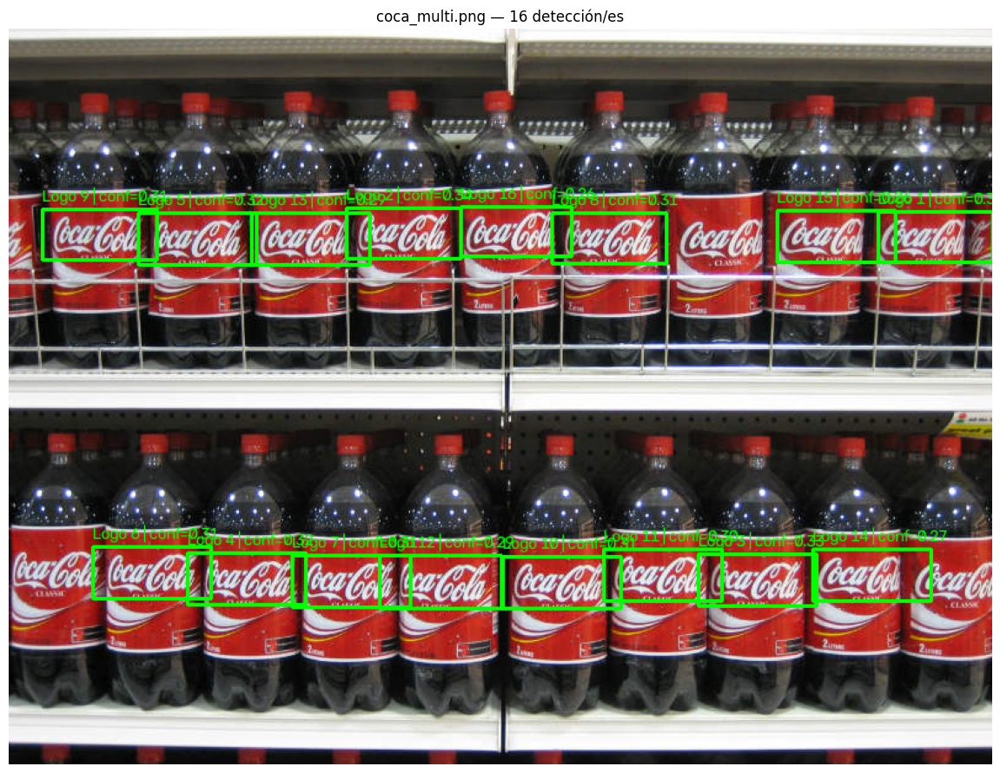

,deteccion,confianza,escala,densidad_bordes,bounding_box
0,1,0.338099,0.232747,0.289274,"(706, 149, 799, 190)"
1,2,0.335407,0.232747,0.303173,"(274, 146, 367, 187)"
2,3,0.330930,0.239665,0.306052,"(560, 427, 656, 469)"
3,4,0.323161,0.239665,0.304563,"(145, 426, 241, 468)"
4,5,0.315416,0.239665,0.313244,"(105, 150, 201, 192)"
5,6,0.312726,0.239665,0.303571,"(68, 421, 164, 463)"
6,7,0.311026,0.239665,0.320437,"(230, 428, 326, 470)"
7,8,0.308090,0.232747,0.305796,"(441, 150, 534, 191)"
8,9,0.305773,0.232747,0.292158,"(27, 147, 120, 188)"
9,10,0.305229,0.239665,0.301339,"(401, 429, 497, 471)"


Cantidad de detecciones: 16


In [18]:
# ============================================================
# Ítem 2 — Visualización específica para template matching
# ============================================================

def draw_multiscale_detections(
    image_bgr,
    detections
):
    """
    Dibuja las detecciones obtenidas mediante
    template matching multiescala.

    Cada detección contiene:
    - box
    - confidence
    - scale
    """

    output = image_bgr.copy()

    for index, detection in enumerate(
        detections,
        start=1
    ):

        x1, y1, x2, y2 = detection["box"]

        cv.rectangle(
            output,
            (x1, y1),
            (x2, y2),
            (0, 255, 0),
            2
        )

        label = (
            f"Logo {index} | "
            f"conf={detection['confidence']:.2f}"
        )

        cv.putText(
            output,
            label,
            (x1, max(20, y1 - 6)),
            cv.FONT_HERSHEY_SIMPLEX,
            0.45,
            (0, 255, 0),
            1,
            cv.LINE_AA
        )

    return output


# ============================================================
# Ítem 2 — Ejecución sobre coca_multi.png
# ============================================================

multi_path = (
    IMAGES_DIR
    / "coca_multi.png"
)

multi_bgr = cv.imread(
    str(multi_path)
)

if multi_bgr is None:
    raise ValueError(
        "No se pudo leer coca_multi.png"
    )

multi_detections = detect_logos_multiscale(
    image_bgr=multi_bgr,
    template_gray=template_gray
)


# ============================================================
# Visualización
# ============================================================

multi_output_bgr = draw_multiscale_detections(
    multi_bgr,
    multi_detections
)

multi_output_rgb = cv.cvtColor(
    multi_output_bgr,
    cv.COLOR_BGR2RGB
)

plt.figure(
    figsize=(16, 9)
)

plt.imshow(
    multi_output_rgb
)

plt.title(
    f"coca_multi.png — "
    f"{len(multi_detections)} detección/es"
)

plt.axis("off")
plt.tight_layout()
plt.show()


# ============================================================
# Tabla de resultados
# ============================================================

item2_rows = []

for i, detection in enumerate(
    multi_detections,
    start=1
):

    item2_rows.append(
        {
            "deteccion": i,
            "confianza": detection[
                "confidence"
            ],
            "escala": detection[
                "scale"
            ],
            "densidad_bordes": detection["edge_density"
            ],
            "bounding_box": detection[
                "box"
            ]
        }
    )

item2_df = pd.DataFrame(
    item2_rows
)

display(
    item2_df
)

print(
    "Cantidad de detecciones:",
    len(multi_detections)
)

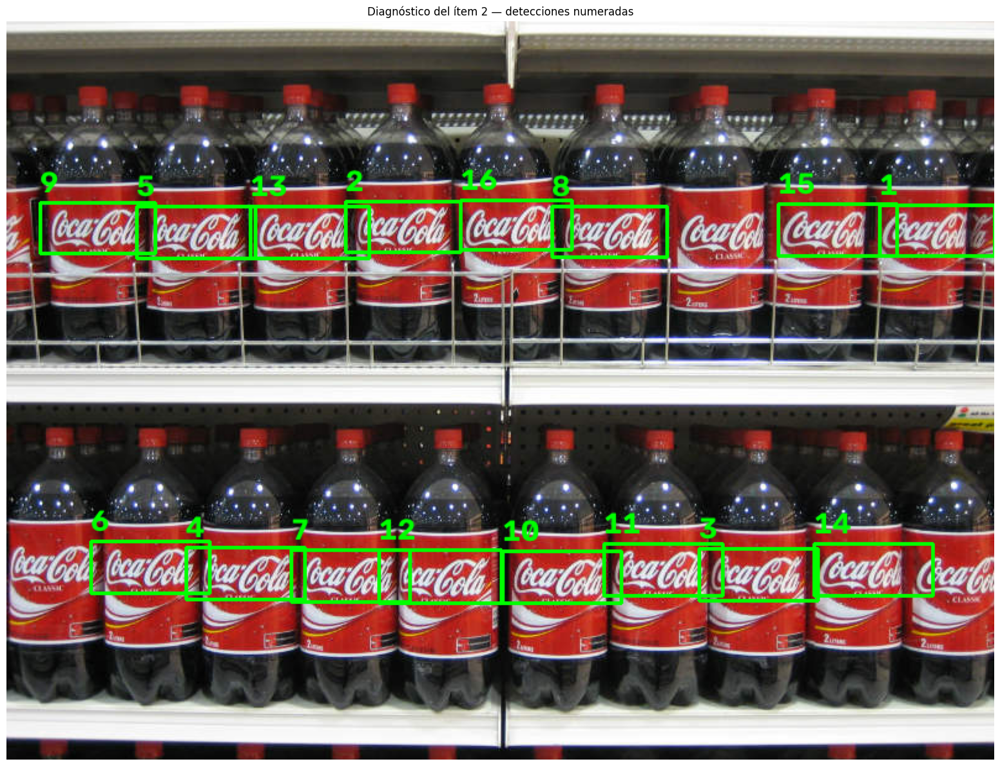

,deteccion,confianza,escala,x1,y1,x2,y2,ancho,alto
0,1,0.3381,0.2327,706,149,799,190,93,41
1,2,0.3354,0.2327,274,146,367,187,93,41
2,3,0.3309,0.2397,560,427,656,469,96,42
3,4,0.3232,0.2397,145,426,241,468,96,42
4,5,0.3154,0.2397,105,150,201,192,96,42
5,6,0.3127,0.2397,68,421,164,463,96,42
6,7,0.3110,0.2397,230,428,326,470,96,42
7,8,0.3081,0.2327,441,150,534,191,93,41
8,9,0.3058,0.2327,27,147,120,188,93,41
9,10,0.3052,0.2397,401,429,497,471,96,42


In [19]:
# ============================================================
# Diagnóstico del ítem 2
# Numeración clara de las detecciones actuales
# ============================================================

diagnostic_bgr = multi_bgr.copy()

for i, detection in enumerate(
    multi_detections,
    start=1
):
    x1, y1, x2, y2 = detection["box"]

    # Bounding box
    cv.rectangle(
        diagnostic_bgr,
        (x1, y1),
        (x2, y2),
        (0, 255, 0),
        2
    )

    # Número de detección
    cv.putText(
        diagnostic_bgr,
        str(i),
        (x1, max(25, y1 - 8)),
        cv.FONT_HERSHEY_SIMPLEX,
        0.8,
        (0, 255, 0),
        2,
        cv.LINE_AA
    )


# ============================================================
# Visualización ampliada
# ============================================================

diagnostic_rgb = cv.cvtColor(
    diagnostic_bgr,
    cv.COLOR_BGR2RGB
)

plt.figure(
    figsize=(20, 12)
)

plt.imshow(
    diagnostic_rgb
)

plt.title(
    "Diagnóstico del ítem 2 — "
    "detecciones numeradas"
)

plt.axis("off")
plt.tight_layout()
plt.show()


# ============================================================
# Tabla diagnóstica
# ============================================================

diagnostic_rows = []

for i, detection in enumerate(
    multi_detections,
    start=1
):
    x1, y1, x2, y2 = detection["box"]

    diagnostic_rows.append(
        {
            "deteccion": i,
            "confianza": detection["confidence"],
            "escala": detection["scale"],
            "x1": x1,
            "y1": y1,
            "x2": x2,
            "y2": y2,
            "ancho": x2 - x1,
            "alto": y2 - y1
        }
    )

diagnostic_df = pd.DataFrame(
    diagnostic_rows
)

display(
    diagnostic_df.round(
        {
            "confianza": 4,
            "escala": 4
        }
    )
)

### Ajuste de parámetros y control de falsos positivos
Se evaluaron distintos umbrales de score. Al reducir demasiado el umbral, reaparecieron falsos positivos en zonas estructuralmente parecidas al logo pero sin contenido semántico válido. Por ese motivo, se adoptó una configuración más conservadora (MULTI_SCORE_THRESHOLD = 0.26 y MIN_EDGE_DENSITY = 0.20), que reduce la cobertura total pero mejora la calidad de las detecciones.

# 6. Ítem 3 — Generalización a todas las imágenes

Los resultados anteriores muestran que los dos detectores presentan comportamientos complementarios:

- SIFT, matching y RANSAC resultan adecuados para las imágenes con una única aparición del logotipo y con variaciones importantes de escala, perspectiva y apariencia.
- El template matching multiescala resulta adecuado para recuperar múltiples apariciones similares en una misma imagen.

Por este motivo se implementa un detector general híbrido. Para cada imagen se ejecuta primero el detector multiescala y se analiza si el conjunto de detecciones presenta las características esperadas de una escena con múltiples logos: cantidad suficiente de candidatos, escala mediana compatible y confianza mediana adecuada.

Si el conjunto de detecciones múltiples resulta consistente, se conserva. En caso contrario, se utiliza como respaldo el detector de una única instancia basado en SIFT y RANSAC.

La misma regla de decisión se aplica automáticamente a todas las imágenes, sin seleccionar el método a partir del nombre del archivo.

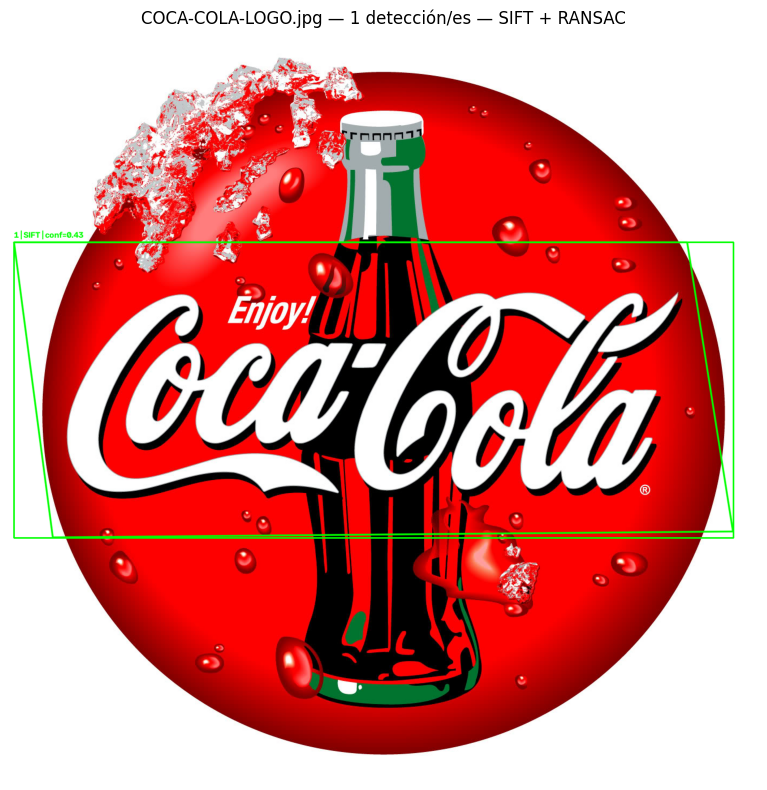

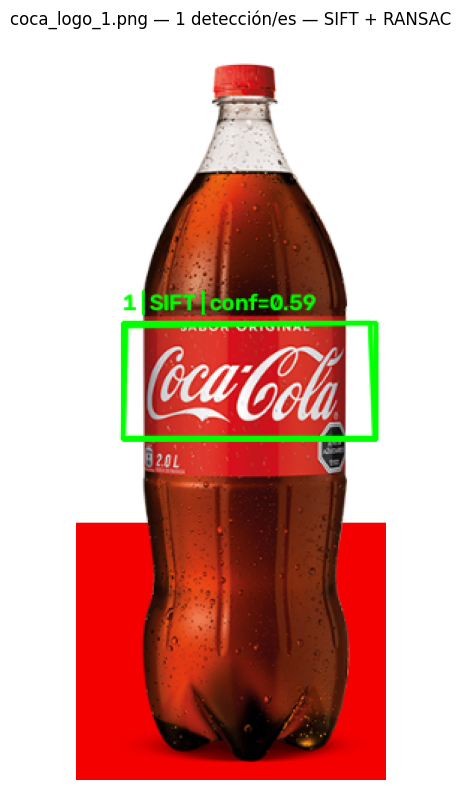

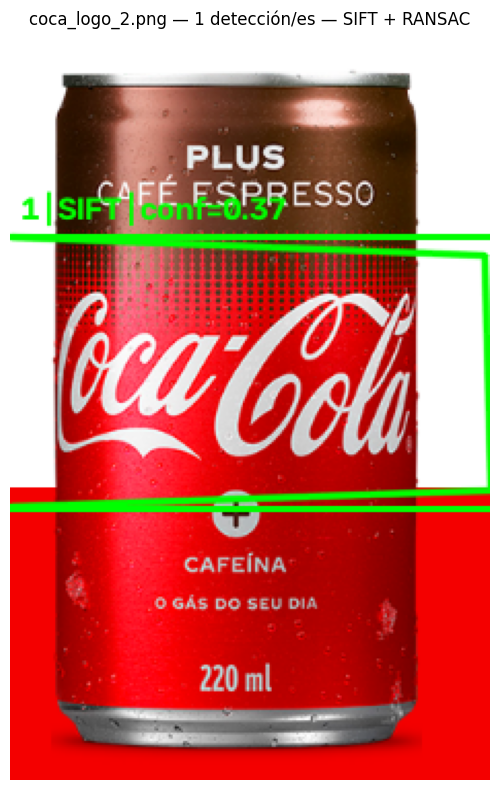

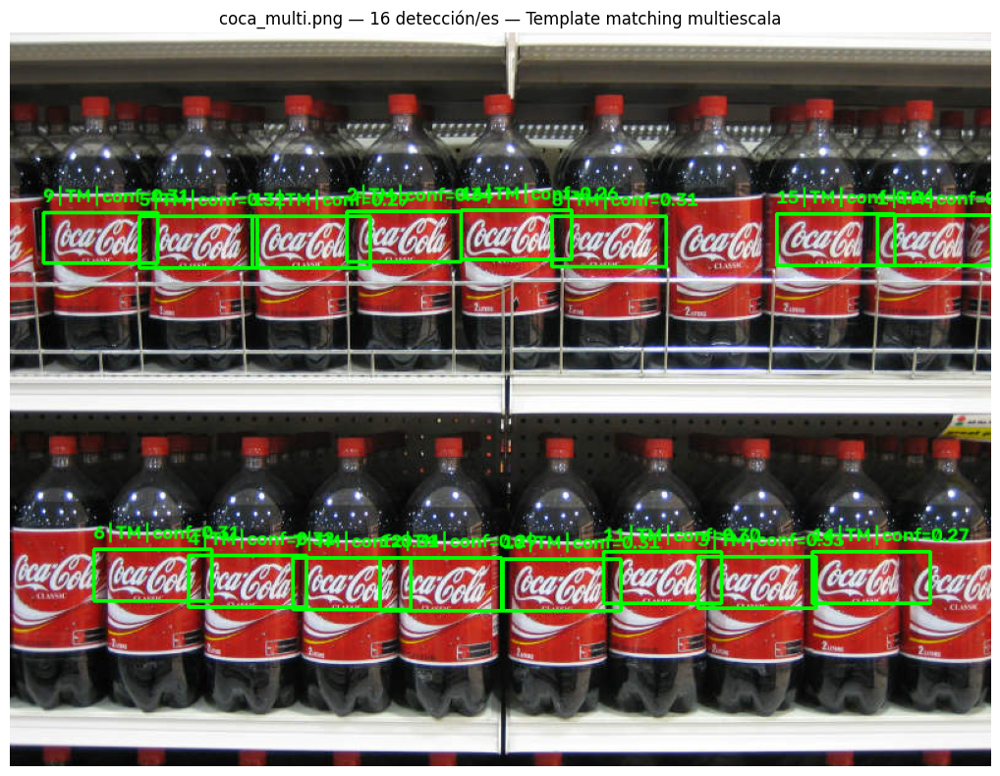

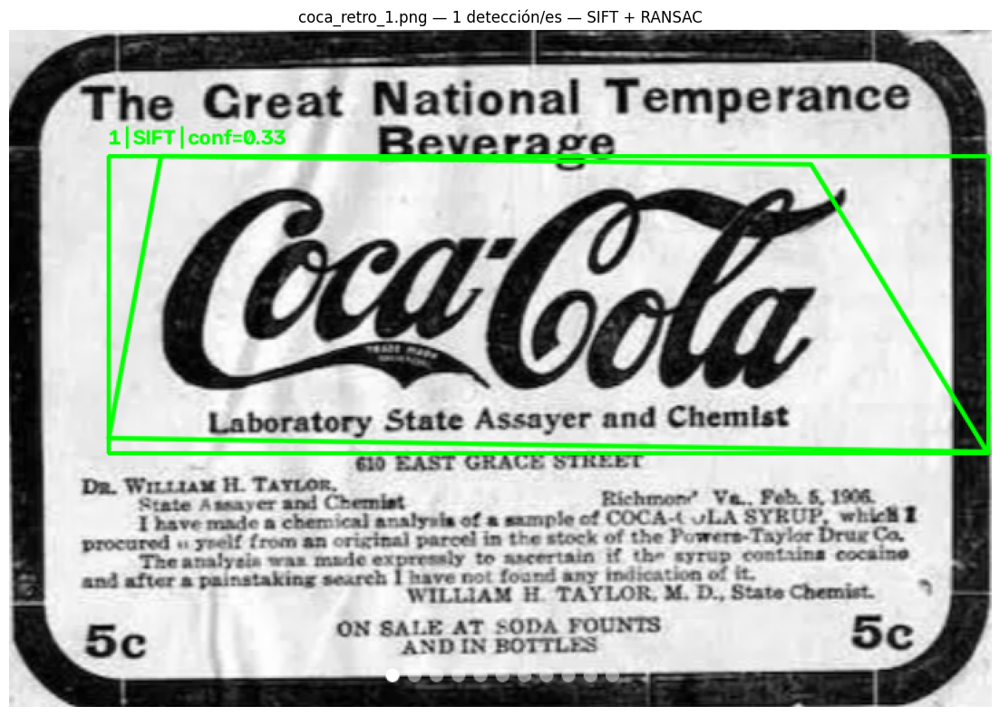

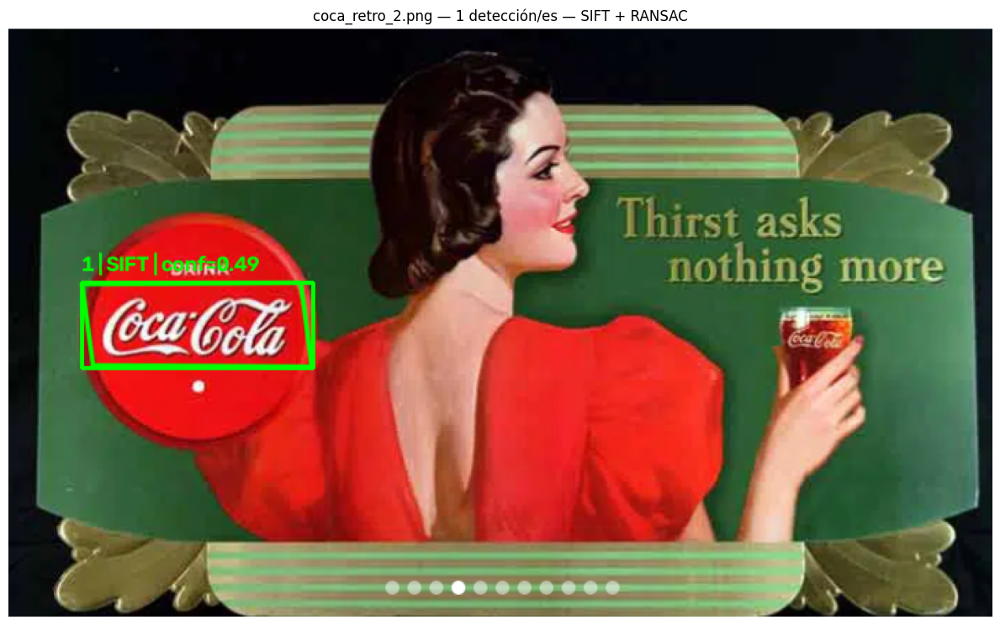

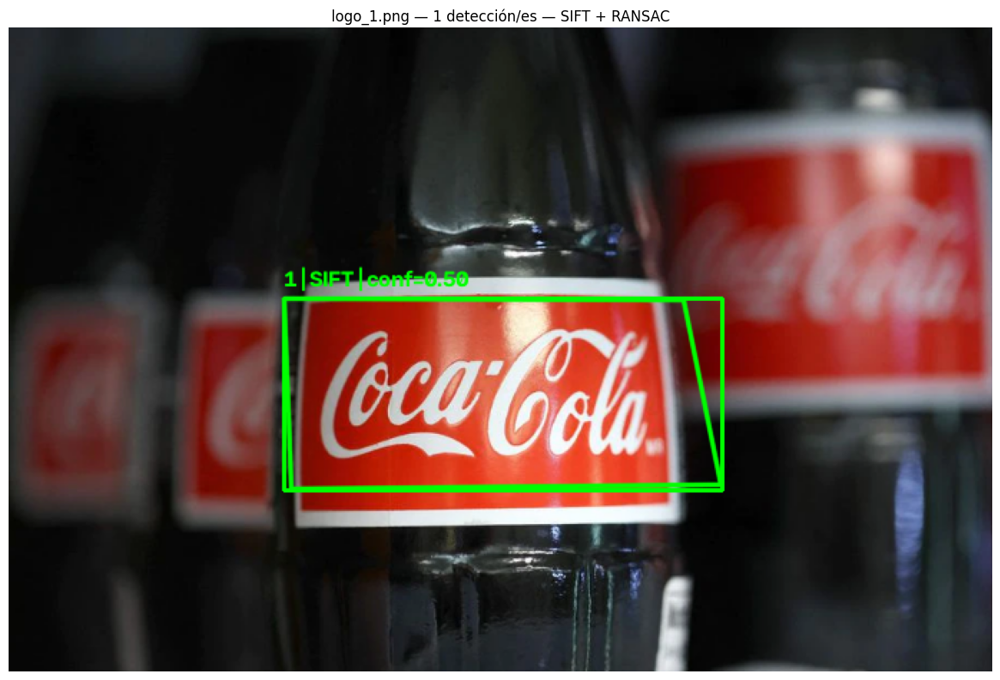

Detalle de las detecciones finales:


,imagen,deteccion,metodo,tipo_confianza,confianza,escala,densidad_bordes,inliers,ratio_inliers,bounding_box
0,COCA-COLA-LOGO.jpg,1,SIFT + RANSAC,Consistencia geométrica,0.4286,NaN,NaN,21.0,0.4286,"(7, 390, 1343, 939)"
1,coca_logo_1.png,1,SIFT + RANSAC,Consistencia geométrica,0.5926,NaN,NaN,32.0,0.5926,"(31, 194, 200, 272)"
2,coca_logo_2.png,1,SIFT + RANSAC,Consistencia geométrica,0.3721,NaN,NaN,32.0,0.3721,"(-30, 99, 234, 231)"
3,coca_multi.png,1,Template matching multiescala,Score combinado,0.3381,0.2327,0.2893,NaN,NaN,"(706, 149, 799, 190)"
4,coca_multi.png,2,Template matching multiescala,Score combinado,0.3354,0.2327,0.3032,NaN,NaN,"(274, 146, 367, 187)"
5,coca_multi.png,3,Template matching multiescala,Score combinado,0.3309,0.2397,0.3061,NaN,NaN,"(560, 427, 656, 469)"
6,coca_multi.png,4,Template matching multiescala,Score combinado,0.3232,0.2397,0.3046,NaN,NaN,"(145, 426, 241, 468)"
7,coca_multi.png,5,Template matching multiescala,Score combinado,0.3154,0.2397,0.3132,NaN,NaN,"(105, 150, 201, 192)"
8,coca_multi.png,6,Template matching multiescala,Score combinado,0.3127,0.2397,0.3036,NaN,NaN,"(68, 421, 164, 463)"
9,coca_multi.png,7,Template matching multiescala,Score combinado,0.3110,0.2397,0.3204,NaN,NaN,"(230, 428, 326, 470)"


Resumen del método seleccionado por imagen:


,imagen,metodo_seleccionado,detecciones_finales,candidatos_multiescala,mediana_confianza_multiescala,mediana_escala_multiescala,multiescala_aceptado
0,COCA-COLA-LOGO.jpg,SIFT + RANSAC,1,0,0.0000,0.0000,False
1,coca_logo_1.png,SIFT + RANSAC,1,0,0.0000,0.0000,False
2,coca_logo_2.png,SIFT + RANSAC,1,0,0.0000,0.0000,False
3,coca_multi.png,Template matching multiescala,16,16,0.3069,0.2397,True
4,coca_retro_1.png,SIFT + RANSAC,1,11,0.2802,0.1545,False
5,coca_retro_2.png,SIFT + RANSAC,1,2,0.3026,0.2504,False
6,logo_1.png,SIFT + RANSAC,1,1,0.2852,0.1638,False


Imágenes con al menos una detección: 7 / 7
Cantidad total de detecciones finales: 22


In [20]:
# ============================================================
# Ítem 3 — Detector general híbrido
# ============================================================

# Una escena se considera de múltiples instancias cuando
# las detecciones multiescala superan conjuntamente estos
# criterios.

GENERAL_MIN_MULTIPLE_DETECTIONS = 4
GENERAL_MIN_MULTI_MEDIAN_CONFIDENCE = 0.29
GENERAL_MIN_MULTI_MEDIAN_SCALE = 0.20


# ============================================================
# Detector híbrido
# ============================================================

def detect_logos_general(
    image_bgr,
    template_gray
):
    """
    Detector general que combina:

    1. Template matching multiescala para escenas con
       múltiples apariciones consistentes.
    2. SIFT + RANSAC como detector de una única instancia.

    La decisión se toma a partir de las características de
    las detecciones y no del nombre de la imagen.
    """

    if image_bgr is None:
        raise ValueError(
            "La imagen de entrada es None."
        )

    if template_gray is None:
        raise ValueError(
            "El template es None."
        )


    # --------------------------------------------------------
    # Primera etapa: detector multiescala
    # --------------------------------------------------------

    multiscale_detections = detect_logos_multiscale(
        image_bgr=image_bgr,
        template_gray=template_gray,
        scales=MULTI_SCALES,
        score_threshold=MULTI_SCORE_THRESHOLD,
        nms_iou=MULTI_NMS_IOU,
        min_edge_density=MIN_EDGE_DENSITY
    )


    # --------------------------------------------------------
    # Métricas del conjunto de detecciones múltiples
    # --------------------------------------------------------

    if multiscale_detections:

        multiscale_confidences = [
            detection["confidence"]
            for detection in multiscale_detections
        ]

        multiscale_scales = [
            detection["scale"]
            for detection in multiscale_detections
        ]

        median_multiscale_confidence = float(
            np.median(
                multiscale_confidences
            )
        )

        median_multiscale_scale = float(
            np.median(
                multiscale_scales
            )
        )

    else:

        median_multiscale_confidence = 0.0
        median_multiscale_scale = 0.0


    # --------------------------------------------------------
    # Regla de aceptación del detector múltiple
    # --------------------------------------------------------

    multiscale_is_consistent = bool(
        len(multiscale_detections)
        >= GENERAL_MIN_MULTIPLE_DETECTIONS

        and median_multiscale_confidence
        >= GENERAL_MIN_MULTI_MEDIAN_CONFIDENCE

        and median_multiscale_scale
        >= GENERAL_MIN_MULTI_MEDIAN_SCALE
    )


    # --------------------------------------------------------
    # Si las detecciones múltiples son consistentes,
    # se normaliza su estructura y se devuelven.
    # --------------------------------------------------------

    if multiscale_is_consistent:

        final_detections = []

        for detection in multiscale_detections:

            normalized_detection = detection.copy()

            normalized_detection.update(
                {
                    "method": (
                        "Template matching multiescala"
                    ),
                    "confidence_type": (
                        "Score combinado"
                    ),
                    "inliers": np.nan,
                    "inlier_ratio": np.nan
                }
            )

            final_detections.append(
                normalized_detection
            )

        diagnostics = {
            "multiscale_candidates": len(
                multiscale_detections
            ),
            "median_multiscale_confidence": (
                median_multiscale_confidence
            ),
            "median_multiscale_scale": (
                median_multiscale_scale
            ),
            "multiscale_accepted": True
        }

        return (
            final_detections,
            "Template matching multiescala",
            diagnostics
        )


    # --------------------------------------------------------
    # Segunda etapa: detector SIFT de una instancia
    # --------------------------------------------------------

    single_detection = detect_single_logo(
        image_bgr=image_bgr,
        template_gray=template_gray
    )


    if single_detection is not None:

        normalized_detection = (
            single_detection.copy()
        )

        normalized_detection.update(
            {
                "method": "SIFT + RANSAC",
                "confidence_type": (
                    "Consistencia geométrica"
                ),
                "scale": np.nan,
                "edge_density": np.nan
            }
        )

        diagnostics = {
            "multiscale_candidates": len(
                multiscale_detections
            ),
            "median_multiscale_confidence": (
                median_multiscale_confidence
            ),
            "median_multiscale_scale": (
                median_multiscale_scale
            ),
            "multiscale_accepted": False
        }

        return (
            [normalized_detection],
            "SIFT + RANSAC",
            diagnostics
        )


    # --------------------------------------------------------
    # Caso sin detecciones válidas
    # --------------------------------------------------------

    diagnostics = {
        "multiscale_candidates": len(
            multiscale_detections
        ),
        "median_multiscale_confidence": (
            median_multiscale_confidence
        ),
        "median_multiscale_scale": (
            median_multiscale_scale
        ),
        "multiscale_accepted": False
    }

    return (
        [],
        "Sin detección",
        diagnostics
    )


# ============================================================
# Visualización unificada
# ============================================================

def draw_general_detections(
    image_bgr,
    detections
):
    """
    Visualiza detecciones procedentes de cualquiera de los
    dos métodos mediante bounding boxes y confianza.
    """

    output = image_bgr.copy()

    for index, detection in enumerate(
        detections,
        start=1
    ):

        x1, y1, x2, y2 = detection["box"]

        x1 = int(x1)
        y1 = int(y1)
        x2 = int(x2)
        y2 = int(y2)


        # ----------------------------------------------------
        # Polígono proyectado, disponible en SIFT
        # ----------------------------------------------------

        if (
            detection["method"] == "SIFT + RANSAC"
            and "polygon" in detection
        ):

            cv.polylines(
                output,
                [
                    np.asarray(
                        detection["polygon"],
                        dtype=np.int32
                    )
                ],
                isClosed=True,
                color=(0, 255, 0),
                thickness=2,
                lineType=cv.LINE_AA
            )


        # ----------------------------------------------------
        # Bounding box
        # ----------------------------------------------------

        cv.rectangle(
            output,
            (x1, y1),
            (x2, y2),
            color=(0, 255, 0),
            thickness=2
        )


        # ----------------------------------------------------
        # Etiqueta
        # ----------------------------------------------------

        method_label = (
            "TM"
            if detection["method"]
            == "Template matching multiescala"
            else "SIFT"
        )

        label = (
            f"{index} | {method_label} | "
            f"conf={detection['confidence']:.2f}"
        )

        text_x = max(
            5,
            x1
        )

        text_y = max(
            25,
            y1 - 8
        )

        cv.putText(
            output,
            label,
            (text_x, text_y),
            cv.FONT_HERSHEY_SIMPLEX,
            0.50,
            color=(0, 255, 0),
            thickness=2,
            lineType=cv.LINE_AA
        )

    return output


# ============================================================
# Ejecución sobre todas las imágenes
# ============================================================

general_results = []
general_summary = []

for image_path in image_paths:

    image_bgr = cv.imread(
        str(image_path)
    )

    if image_bgr is None:

        print(
            f"Advertencia: no se pudo leer "
            f"{image_path.name}"
        )

        continue


    detections, selected_method, diagnostics = (
        detect_logos_general(
            image_bgr=image_bgr,
            template_gray=template_gray
        )
    )


    # --------------------------------------------------------
    # Visualización
    # --------------------------------------------------------

    output_bgr = draw_general_detections(
        image_bgr,
        detections
    )

    output_rgb = cv.cvtColor(
        output_bgr,
        cv.COLOR_BGR2RGB
    )

    plt.figure(
        figsize=(12, 8)
    )

    plt.imshow(
        output_rgb
    )

    plt.title(
        f"{image_path.name} — "
        f"{len(detections)} detección/es — "
        f"{selected_method}"
    )

    plt.axis("off")
    plt.tight_layout()
    plt.show()


    # --------------------------------------------------------
    # Resumen por imagen
    # --------------------------------------------------------

    general_summary.append(
        {
            "imagen": image_path.name,
            "metodo_seleccionado": selected_method,
            "detecciones_finales": len(detections),
            "candidatos_multiescala": diagnostics[
                "multiscale_candidates"
            ],
            "mediana_confianza_multiescala": diagnostics[
                "median_multiscale_confidence"
            ],
            "mediana_escala_multiescala": diagnostics[
                "median_multiscale_scale"
            ],
            "multiescala_aceptado": diagnostics[
                "multiscale_accepted"
            ]
        }
    )


    # --------------------------------------------------------
    # Detalle de cada detección
    # --------------------------------------------------------

    if detections:

        for detection_index, detection in enumerate(
            detections,
            start=1
        ):

            general_results.append(
                {
                    "imagen": image_path.name,
                    "deteccion": detection_index,
                    "metodo": detection["method"],
                    "tipo_confianza": detection[
                        "confidence_type"
                    ],
                    "confianza": detection[
                        "confidence"
                    ],
                    "escala": detection["scale"],
                    "densidad_bordes": detection[
                        "edge_density"
                    ],
                    "inliers": detection["inliers"],
                    "ratio_inliers": detection[
                        "inlier_ratio"
                    ],
                    "bounding_box": detection["box"]
                }
            )

    else:

        general_results.append(
            {
                "imagen": image_path.name,
                "deteccion": 0,
                "metodo": "Sin detección",
                "tipo_confianza": "-",
                "confianza": 0.0,
                "escala": np.nan,
                "densidad_bordes": np.nan,
                "inliers": np.nan,
                "ratio_inliers": np.nan,
                "bounding_box": None
            }
        )


# ============================================================
# Tablas de resultados
# ============================================================

general_df = pd.DataFrame(
    general_results
)

general_summary_df = pd.DataFrame(
    general_summary
)


# Redondeo para facilitar la lectura

columns_to_round = [
    "confianza",
    "escala",
    "densidad_bordes",
    "ratio_inliers"
]

for column in columns_to_round:

    if column in general_df.columns:

        general_df[column] = (
            general_df[column].round(4)
        )


summary_columns_to_round = [
    "mediana_confianza_multiescala",
    "mediana_escala_multiescala"
]

for column in summary_columns_to_round:

    if column in general_summary_df.columns:

        general_summary_df[column] = (
            general_summary_df[column].round(4)
        )


print(
    "Detalle de las detecciones finales:"
)

display(
    general_df
)


print(
    "Resumen del método seleccionado por imagen:"
)

display(
    general_summary_df
)


# ============================================================
# Resumen general
# ============================================================

images_with_detections = int(
    (
        general_summary_df[
            "detecciones_finales"
        ] > 0
    ).sum()
)

total_images = len(
    general_summary_df
)

total_detections = int(
    general_summary_df[
        "detecciones_finales"
    ].sum()
)

print(
    f"Imágenes con al menos una detección: "
    f"{images_with_detections} / {total_images}"
)

print(
    f"Cantidad total de detecciones finales: "
    f"{total_detections}"
)

### Resultado del ítem 3

El detector general aplica la misma regla automática a todas las imágenes.

Cuando el template matching multiescala produce un conjunto numeroso y consistente de detecciones, se interpreta que la imagen contiene múltiples apariciones similares del logotipo y se conservan esas detecciones.

Cuando el conjunto multiescala no supera los criterios de consistencia, se utiliza el detector basado en SIFT y RANSAC para recuperar una única aparición.

La tabla de detalle informa el método que produjo cada detección y distingue entre dos tipos de confianza:

- `Score combinado`: respuesta del template matching por intensidades y bordes.
- `Consistencia geométrica`: medida basada en los inliers de RANSAC.

Estas medidas permiten ordenar y describir las detecciones dentro de cada método, pero no representan probabilidades estadísticas ni son directamente comparables entre sí.

El cumplimiento del ítem se verifica visualmente comprobando que cada bounding box corresponda al logotipo y que la regla general seleccione adecuadamente detecciones únicas o múltiples sin utilizar el nombre del archivo.

# 7. Resumen y conclusiones

La solución desarrollada combina dos estrategias de detección complementarias.

Para las imágenes con una única aparición del logotipo se utilizan características locales SIFT, correspondencia de descriptores mediante FLANN o BFMatcher, ratio test de Lowe, estimación de homografía con RANSAC y validación geométrica.

Para las escenas con múltiples apariciones similares se utiliza template matching multiescala, combinando comparación por intensidades y bordes, detección de máximos locales, validación por densidad de bordes y Non-Maximum Suppression (NMS).

## Resultados principales

- En el **ítem 1**, el detector basado en SIFT y RANSAC obtuvo una detección válida en las seis imágenes individuales. La inspección visual permite confirmar que los bounding boxes corresponden al logotipo y que no se observan falsos positivos.

- En el **ítem 2**, el detector multiescala recuperó 16 apariciones del logotipo en `coca_multi.png`. El ajuste del umbral de similitud, la densidad mínima de bordes y NMS permitió eliminar las detecciones incorrectas observadas sobre la estantería.

- En el **ítem 3**, se implementó un detector general híbrido que aplica la misma regla automática a todas las imágenes. Cuando el conjunto de detecciones multiescala presenta una cantidad, confianza mediana y escala mediana compatibles con una escena de múltiples instancias, se conservan esas detecciones. En caso contrario, se utiliza el detector SIFT y RANSAC para recuperar una única aparición.

El detector general seleccionó SIFT y RANSAC para las seis imágenes individuales y template matching multiescala para `coca_multi.png`. Como resultado, se obtuvo al menos una detección en las siete imágenes del conjunto, con un total de 22 detecciones finales: 16 en la imagen múltiple y una en cada una de las seis imágenes restantes.

## Interpretación de la confianza

La confianza informada depende del método utilizado:

- En SIFT y RANSAC representa una medida de consistencia geométrica basada en la cantidad y proporción de inliers.
- En template matching multiescala representa el score combinado de similitud por intensidades y bordes.

Estas medidas permiten evaluar y ordenar las detecciones dentro de cada método, pero no representan probabilidades estadísticas ni son directamente comparables entre sí.

## Conclusión

Los resultados muestran que un único método no ofrece el mismo desempeño frente a todas las variaciones presentes en las imágenes. SIFT y RANSAC presentan mayor robustez ante cambios de escala, perspectiva, contraste y apariencia, mientras que el template matching multiescala resulta más adecuado para localizar numerosas repeticiones similares dentro de una misma escena.

La integración de ambos enfoques permite responder a las tres consignas del trabajo práctico, visualizar cada detección mediante bounding boxes, informar un nivel de confianza y aplicar una regla general de selección sin depender del nombre del archivo analizado.